<img src='../images/cbslogo.jpg' width="30%" align="left" />

# Data Understanding
## - Phase: Data Understanding -

Dieses Notebook fasst die wichtigsten Ergebnisse der Data Understanding Phase zusammen. 

Dieses Notebook nutzt die folgenden Dateien:
tripdata_coordinates.pkl,
sightseeing_coordinates.pkl,
weather_alt.pkl,
weather_raw.pkl,
airdistance_tripdata_coordinates.pkl,
Station_Data.csv,
Feiertage.xlsx,
bike_operation_times.pkl,
bike_idle_times.pkl

    
Dieses Notebook erzeugt die Datei trips_weather.pkl.  

In [2]:
import pandas as pd
import numpy as np
import datetime
import matplotlib
import geopy.distance
import missingno as msno
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from workalendar.core import Calendar
#import pandas_profiling as pp
%matplotlib inline

In [3]:
RAWDATA_PATH = '../data/raw'
DATA_PATH = '../data/'
STATION_LOCATION = RAWDATA_PATH+'/Station_Data.csv'
COMBINED_DATA = DATA_PATH + '/tripdata_coordinates.pkl'
HOLIDAYS = DATA_PATH + 'Feiertage.xlsx'
BIKE_OPERATION_TIMES_FILE = 'bike_operation_times.pkl'
BIKE_IDLE_TIMES_FILE = 'bike_idle_times.pkl'

In [4]:
# Ausleihvorgänge wurden ergänzt um Koordinaten der einzelnen Stationen
df_coords = pd.read_pickle(DATA_PATH + 'tripdata_coordinates.pkl')
# Datenset mit Sehenswürdigkeiten in Washington
df_sights = pd.read_pickle(DATA_PATH + 'sightseeing_coordinates.pkl')
df_holiday_data = pd.read_excel(HOLIDAYS,header = 0)
df_weather_alt = pd.read_pickle (DATA_PATH+'weather_alt.pkl')
df_weather_raw = pd.read_pickle(DATA_PATH+'weather_raw.pkl')
df_station_data = pd.read_pickle(DATA_PATH + 'airdistance_tripdata_coordinates.pkl')

## 1. Data Description 
##### Datenanalyse mittels Pandas Profile Report

In [4]:
from pandas_profiling import ProfileReport

In [5]:
#Der Report dieses Befehls befindet sich im Github Archiv.
report = df_coords.profile_report(minimal = True) 
#report.to_file(output_file="report.html")

##### Kurzübersicht über unsere vorliegenden Datentypen

In [6]:
df_coords.dtypes

start_ts                   datetime64[ns]
end_ts                     datetime64[ns]
start_station_id                    int64
end_station_id                      int64
bike_number                        object
Member type                        object
start_date                 datetime64[ns]
start_hour                          int64
end_date                   datetime64[ns]
end_hour                            int64
Latitude_start_station            float64
Longitude_start_station           float64
Latitude_end_station              float64
Longitude_end_station             float64
start_day_of_week                  object
end_day_of_week                    object
dtype: object

**Hieran schließt die explorative Datenanalyse inklusive Qualitätsbeurteilung der jeweiligen Analyseinhalte an.**

## 2. Analyse der Fahrradstationen und ihrer Ausbreitung

Eine interessante Fragestellung ist die Entwicklung der Anzahl der Stationen im Lauf der Jahre.

Anzahl der Start und Endstationen in den analysierten Jahren:

In [7]:
len(df_coords['start_station_id'].unique()), len(df_coords['end_station_id'].unique())

(483, 483)

### Gibt es Stationen, die nur Startstationen sind?

Zunächst wird analysiert, ob es Stationen gibt welche exklusiv als Start- oder Endstation verwendet werden.

In [8]:
Start_stations_ids = df_coords["start_station_id"].unique()
End_stations_ids = df_coords["end_station_id"].unique()
Start_stations_ids.sort()
End_stations_ids.sort()

Start_stations_ids = Start_stations_ids.tolist()
End_stations_ids = End_stations_ids.tolist()

In [9]:
def matches_out(list1, list2):
    set1 = set(list1)
    set2 = set(list2)
    set3 = set1.intersection(set2)
    found = []
    for match in set3:
        found.append(match)
    return found

In [10]:
Matches = matches_out(End_stations_ids,Start_stations_ids)
len(Matches)

483

Ergebnis: Alle Stationen werden als Start- und Endstationen verwendet.

### Kommen neue Stationen über die Jahre hinzu?

Vorbereitung: Welche wie viele Stationen sind in den analysierten Jahren jeweils vorhanden und welche Jahren werden analysiert.

In [11]:
df_coords['year'] = df_coords['start_date'].dt.year

In [12]:
df_coords["year"].unique()

array([2015, 2016, 2017], dtype=int64)

In [13]:
# Startstationen im Jahr 2015
new_df_coords_2015 = df_coords.query("year == '2015'")
stations_2015 = new_df_coords_2015["start_station_id"].unique()

In [14]:
len(stations_2015)

353

In [15]:
new_df_coords_2016 = df_coords.query("year == '2016'")
stations_2016 = new_df_coords_2016["start_station_id"].unique()

In [16]:
len(stations_2016)

430

In [17]:
new_df_coords_2017 = df_coords.query('year=="2017"')
stations_2017 =new_df_coords_2017['start_station_id'].unique()

In [18]:
len(stations_2017)

483

Im nächsten Schritt wird untersucht, welche Stationen im Laufe der Jahre hinzukamen und deren Ausbreitung auf einer Karte dargestellt.
Zunächst wird die Anzahl der Startstationen analysiert. Da die Endstationen und Startstationen sich in den jeweiligen Jahren nicht unterscheiden, wird  auf die Darstellung der Endstationen im Diagramm zum Zwecke der Übersichtlichkeit verzichtet.

In [19]:
newstationin2016 = list(set(stations_2016) - set(stations_2015)) 
newstationin2017 = list(set(stations_2017) - set(stations_2016))

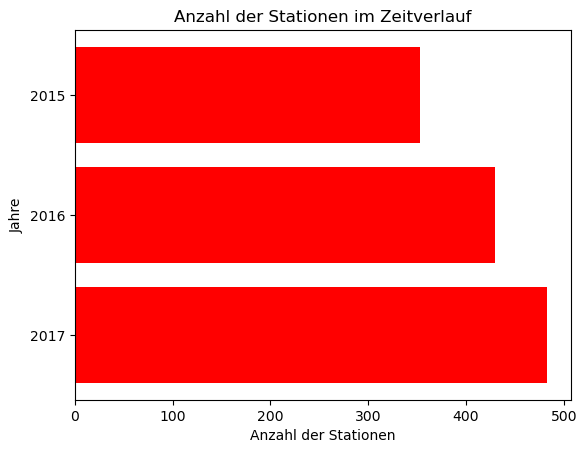

In [20]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
plt.rcdefaults() 
fig, ax = plt.subplots()
farbe = ['red', 'red', 'red']
years = ('2015','2016','2017')
y_pos_years = np.arange(len(years))
anzahl = (len(stations_2015), len(stations_2016),len(stations_2017))
ax.barh(y_pos_years, anzahl, align='center',
        color=farbe, ecolor='black')
ax.set_yticks(y_pos_years)
ax.set_yticklabels(years)
ax.invert_yaxis()  # labels von oben nach unten
ax.set_xlabel('Anzahl der Stationen')
ax.set_ylabel('Jahre')
ax.set_title('Anzahl der Stationen im Zeitverlauf')
plt.show()

Das folgende Diagramm zeigt die Anzahl der neuen Station verglichen mit dem Vorjahr: 

Bemerkung: Die Gitterlinien dienen der besseren Lesbarkeit.

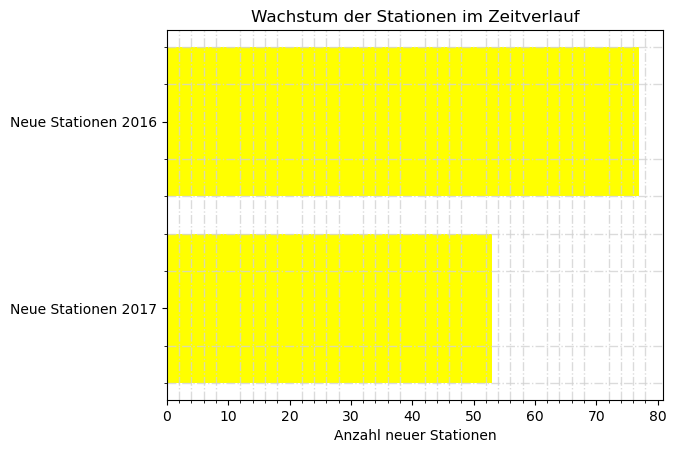

In [21]:
plt.rcdefaults() 
fig, ax = plt.subplots()
farbe = ['yellow']
wachstum = ('Neue Stationen 2016','Neue Stationen 2017')
y_pos_wachstum = np.arange(len(wachstum))
anzahl = (len(newstationin2016),len(newstationin2017))
ax.barh(y_pos_wachstum, anzahl, align='center',
        color=farbe, ecolor='black')
ax.set_yticks(y_pos_wachstum)
ax.set_yticklabels(wachstum)
ax.invert_yaxis()  # labels von oben nach unten
ax.set_xlabel('Anzahl neuer Stationen')
ax.set_ylabel('')
ax.set_title('Wachstum der Stationen im Zeitverlauf')
plt.minorticks_on()
plt.grid(b=True, which='minor', color='lightgrey', alpha=0.8, ls='-.', lw=1)
plt.show()

In [22]:
##Einlesen der Karte und Definition eines Wertebereichs für die Koordinaten
BBox = ((df_coords.Longitude_start_station.min(),   df_coords.Longitude_start_station.max(),      
         df_coords.Latitude_start_station.min(), df_coords.Latitude_start_station.max()))

map_w= plt.imread('../images/map.png')

Zunächst werden alles Stationen auf der Karte dargestellt, die es im Jahr 2015 gab.

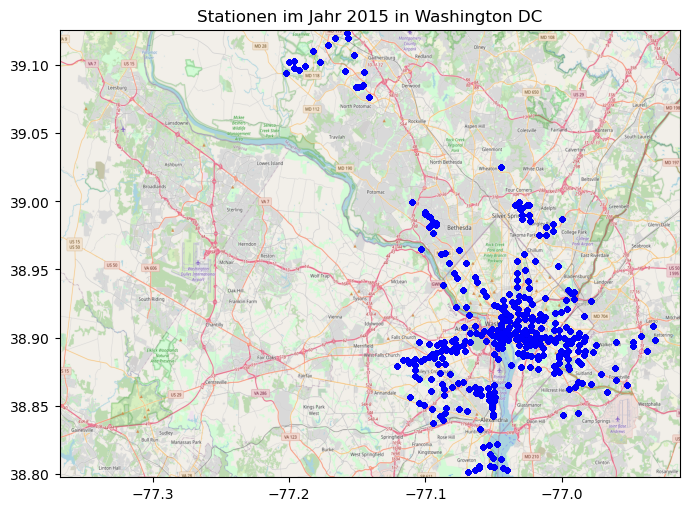

In [23]:
fig, ax = plt.subplots(figsize = (8,7))
ax.scatter(new_df_coords_2015.Longitude_start_station, new_df_coords_2015.Latitude_start_station, zorder=1, alpha= 0.3,c='b', s=10)
ax.set_title('Stationen im Jahr 2015 in Washington DC')
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(map_w, zorder=0, extent = BBox, aspect= 'equal')

Im nächsten Schritt wird die Ausbreitung der Stationen visualisiert. Blau steht hierbei für die Stationen aus dem Jahr 2015, rot für Stationen die in 2016 hinzugekommen sind und schwarz für die Stationen, die 2017 ergänzt wurden.

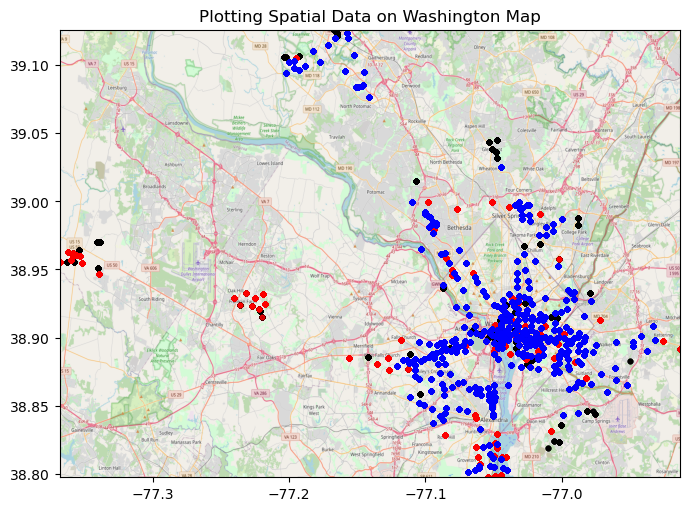

In [24]:
# Karte mit der Stationenausbreitung über die Analysierten Jahre
fig, ax = plt.subplots(figsize = (8,7))
ax.scatter(new_df_coords_2017.Longitude_start_station, new_df_coords_2017.Latitude_start_station, zorder=1, alpha= 0.3,c='black', s=10)
ax.scatter(new_df_coords_2016.Longitude_start_station, new_df_coords_2016.Latitude_start_station, zorder=1, alpha= 0.4,c='r', s=10)
ax.scatter(new_df_coords_2015.Longitude_start_station, new_df_coords_2015.Latitude_start_station, zorder=1, alpha= 0.5,c='b', s=10)
ax.set_title('Ausbreitung der Fahrradstationen')
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(map_w, zorder=0, extent = BBox, aspect= 'equal');

Ergebnis: Es ist keine systematische Ausbreitung der Stationen über das Stadtgebiet von Washington DC hinweg erkennbar.
Im Jahr 2016 sind zwei neue Stadtteile durch CapitelBikeShare erschlossen worden.
Das Kerngebiet wurde über den Analysezeitraum ohne erkennbares Muster erweitert.

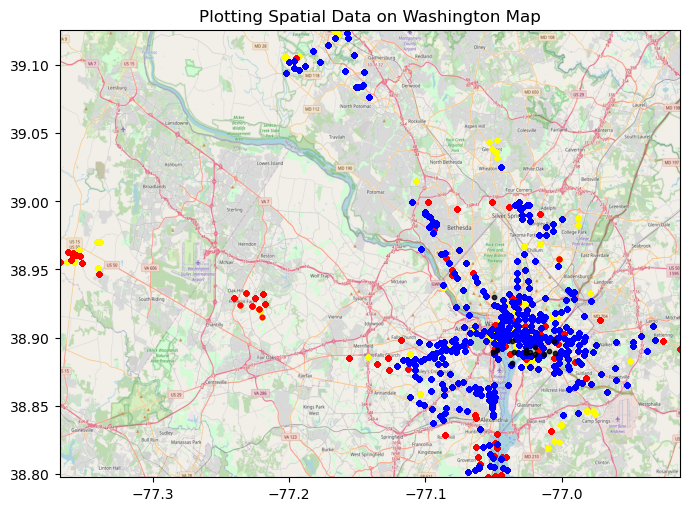

In [25]:
SBox = (df_sights.Longitude.min(), df_sights.Longitude.max(),      
         df_sights.Latitude.min(), df_sights.Latitude.max())

map_s= plt.imread('../images/maps.png')

# Sehenswürdigkeiten und Fahrradstationen in einer Karte darstellen
fig, ax = plt.subplots(figsize = (8,7))
ax.scatter(new_df_coords_2017.Longitude_start_station, new_df_coords_2017.Latitude_start_station, zorder=1, alpha= 0.5,c='yellow', s=10)
ax.scatter(new_df_coords_2016.Longitude_start_station, new_df_coords_2016.Latitude_start_station, zorder=1, alpha= 0.5,c='r', s=10)
ax.scatter(new_df_coords_2015.Longitude_start_station, new_df_coords_2015.Latitude_start_station, zorder=1, alpha= 0.5,c='b', s=10)
ax.scatter( df_sights.Longitude, df_sights.Latitude, zorder=1, alpha= 0.8, c='black', s=10)
ax.set_title('Fahrradstationen und Sehenswürdigkeiten in Washington DC')
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(map_w, zorder=0, extent = BBox, aspect= 'equal');

### Entfernungen zwischen den einzelnen Stationen

Die Entfernung zwischen den Stationen wurde auf Basis einer Luftlinienberechnung durchgeführt. Hierfür wurde die Haversine Methode verwendet. 

In [5]:
df_station_data.distance_Float.value_counts()

0.000000       383964
1471.487553     38819
1400.095493     33014
881.757354      25509
1805.147812     21935
                ...  
8952.927355         1
6356.254968         1
7670.931918         1
7226.973312         1
8535.910021         1
Name: distance_Float, Length: 49254, dtype: int64

Erkenntnis: Es gibt 383964 Fahrten bei denen die Start- und Endstation identisch ist.

Wie viele Routen werden nur einmal gefahren?

In [9]:
einmalRouten = (df_station_data.distance_Float.value_counts() == 1)
einmalRouten.sum()

6486

Im Datensatz sind 6486 Routen vorhanden, welche genau einmal gefahren werden.

## 3. Analyse der Fahrradnutzung

### 3.1 Datenqualität

In [26]:
# wie viele Fahrräder gibt es?
bikes_count = len(df_coords["bike_number"].unique())
print(f"Number of unique bikes: {bikes_count:n}")

Number of unique bikes: 4764


In [27]:
# bike_number entspricht in der Regel einem bestimmten Schema (W21022). Welche entsprechen nicht diesem Schema?
bike_numbers = pd.Series(df_coords["bike_number"].unique())
bike_numbers_valid = bike_numbers.str.count(r'(^[wW][0-9]{1,7})')
bike_numbers_invalid = bike_numbers[~bike_numbers.str.contains(r'(^[wW][0-9]{1,7})')==True]

bike_numbers_valid_count = bike_numbers_valid.sum()
bike_numbers_invalid_count = len(bike_numbers_invalid)

# Manche IDs fangen mit "w" anstatt "W" an. Korrigieren?
print(f"Number of bikes with valid number: {bike_numbers_valid_count:n}")
print(f"Number of bikes with invalid number: {bike_numbers_invalid_count:n}")
print(f"List of invalid bike numbers: {bike_numbers_invalid}")

Number of bikes with valid number: 4763
Number of bikes with invalid number: 1
List of invalid bike numbers: 0    ?(0x0000000074BEBCE4)
dtype: object


C:\Users\Britta\anaconda3\lib\site-packages\pandas\core\strings.py:2001: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


In [28]:
# In wie vielen Zeilen kommt die invalide ID vor?
filter_df_invalid_rows = df_coords.loc[~df_coords["bike_number"].str.contains(r'(^[wW][0-9]{1,7})')==True]
filter_df_invalid_rows.shape

C:\Users\Britta\anaconda3\lib\site-packages\pandas\core\strings.py:2001: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


(50, 17)

In [29]:
# Neuen Dataframe nur mit validen Zeilen erstellen
filter_df_valid_rows = df_coords.loc[df_coords["bike_number"].str.contains(r'(^[wW][0-9]{1,7})')==True]
filter_df_valid_rows.shape

C:\Users\Britta\anaconda3\lib\site-packages\pandas\core\strings.py:2001: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


(10232832, 17)

In [30]:
# Prüfen, ob es leere Zellen gibt
filter_df_valid_rows["bike_number"].isnull().sum()

0

### 3.2 Auswertungen

### 3.2.1) Betriebszeit

Im Folgenden soll die Betriebszeit der einzelnen Fahrräder näher untersucht werden. 
Wir werden ermitteln, wie hoch die _Durchschnittliche Betriebszeit_ jedes Fahrrads ausfällt und wie hoch die _Gesamte Betriebsdauer_ ist. Zudem wird das Datum der ersten und der letzten Ausleihe festgehalten. 

In [31]:
# Füge die Dauer der Ausleihe hinzu
filter_df_valid_rows = filter_df_valid_rows.assign(duration = (filter_df_valid_rows["end_ts"] - filter_df_valid_rows["start_ts"]))
filter_df_valid_rows.head()

,start_ts,end_ts,start_station_id,end_station_id,bike_number,Member type,start_date,start_hour,end_date,end_hour,Latitude_start_station,Longitude_start_station,Latitude_end_station,Longitude_end_station,start_day_of_week,end_day_of_week,year,duration
1,2016-07-08 20:44:21,2016-07-08 21:11:54,31219,31634,W00099,Casual,2016-07-08,20,2016-07-08,21,38.893028,-77.026013,38.87501,-77.0024,Friday,Friday,2016,0 days 00:27:33
2,2017-10-14 19:47:46,2017-10-14 20:02:32,31219,31634,W00139,Member,2017-10-14,19,2017-10-14,20,38.893028,-77.026013,38.87501,-77.0024,Saturday,Saturday,2017,0 days 00:14:46
3,2017-05-14 15:50:53,2017-05-14 16:33:31,31219,31634,W00242,Casual,2017-05-14,15,2017-05-14,16,38.893028,-77.026013,38.87501,-77.0024,Sunday,Sunday,2017,0 days 00:42:38
4,2016-06-22 19:03:37,2016-06-22 19:20:51,31219,31634,W00277,Member,2016-06-22,19,2016-06-22,19,38.893028,-77.026013,38.87501,-77.0024,Wednesday,Wednesday,2016,0 days 00:17:14
5,2015-08-04 19:14:42,2015-08-04 19:36:15,31219,31634,W00281,Casual,2015-08-04,19,2015-08-04,19,38.893028,-77.026013,38.87501,-77.0024,Tuesday,Tuesday,2015,0 days 00:21:33


In [32]:
# Konvertiere die Ausleihdauer, damit 'mean' und 'sum' berechnet werden kann
filter_df_valid_rows["duration"] = (filter_df_valid_rows["duration"].dt.total_seconds())/60

* Wie oft wurde jedes Fahrrad ausgeliehen? 
* Wie war die durchschnittliche Ausleihdauer?
* Wann wurde es zum ersten/letzten Mal ausgeliehen?

In [33]:
# Erstelle einen Dataframe mit den Ausleihen zu jedem Fahrrad
bike_df = filter_df_valid_rows.groupby(by=["bike_number"]).agg(['mean', 'count', 'sum'])

bike_df = bike_df[[('start_station_id', 'count'), ('duration', 'mean'), ('duration', 'sum')]]
bike_df.columns = ["rental_count", "mean_rental_duration_m", "total_rental_duration_m"]

In [34]:
# Füge Datum 'Erste Ausleihe' und Datum 'Letzte Ausleihe' hinzu
tmp_bike_df = filter_df_valid_rows.groupby(by=["bike_number"]).agg({
    'start_ts' : np.min, 
    'end_ts': np.max})
tmp_bike_df.columns = ["first_rental_ts", "last_rental_ts"]

bike_df = pd.concat([bike_df, tmp_bike_df], axis=1, sort=False)
bike_df.head()

,rental_count,mean_rental_duration_m,total_rental_duration_m,first_rental_ts,last_rental_ts
bike_number,,,,,
W00005,2513,19.369260,48674.950000,2015-01-13 05:43:51,2017-12-26 16:52:52
W00006,1561,17.311478,27023.216667,2015-01-03 13:23:03,2016-05-27 11:29:13
W00007,2744,17.182580,47149.000000,2015-01-02 09:03:45,2017-12-30 11:50:57
W00008,2200,16.949795,37289.550000,2015-01-01 14:24:38,2017-12-27 22:03:44
W00009,3076,19.103993,58763.883333,2015-01-02 08:20:29,2017-12-31 08:58:25


In [35]:
# Plot
fig = go.Figure(
    data=go.Scatter(
    x = bike_df["mean_rental_duration_m"],
    y = bike_df["total_rental_duration_m"],
    hovertext=[f"{bike}<br>Mean: {round(mean_d, 2)} min, Total: {round(total_d/60, 2)} h<br>{total:n} Ausleihen" 
               for mean_d, total_d, total, bike
               in zip(bike_df["mean_rental_duration_m"], bike_df["total_rental_duration_m"], bike_df["rental_count"], bike_df.index)],
    hoverinfo = 'text',
    mode='markers',
    marker=dict(
        color=bike_df["rental_count"],
        colorscale='Viridis',
        line_width=1,
        showscale=True
    )
),
    layout={
        "title": {"text": "Ausleihvorgänge je Fahrrad"},
        "xaxis_title":"Durchschnittliche Ausleihdauer [min]",
        "yaxis_title":"Gesamte Ausleihdauer [min]",
    }
)

fig.update_layout(
    xaxis_type="log", 
    #yaxis_type="log"
)

fig.show()

Erste Vermutungen, die man aus dem Graph ableiten kann:
* Die allermeisten Fahrräder werden im Schnitt zwischen 15-25min lang ausgeliehen
* Es gibt einzelne Fahrräder, welche sich deutlich vom Durchschnitt abheben
* Es gibt aber auch Räder, welche im Durchschnitt nur eine sehr kurze Ausleihdauer <10min haben

Weiterführende Fragen: 
* Welche Fahrräder heben sich in der durchnittlichen Mietdauer wesentlich von den anderen ab und woran kann das liegen?
* Warum werden manche Fahrräder nur kurz und wenig ausgeliehen? Sind das eventuell die neueren Fahrräder?

### 3.2.2) Leerlaufzeit

In [36]:
# Next Steps: 
# Wie lange stehen die Fahrräder im Durchschnitt herum ('idle'), bevor sie wieder ausgeliehen werden?
# Gibt es Fahrräder, welche besonders lange 'idlen'?
# Zusammenführen in neuer Tabelle [startTime, endTime, bike_number, time(O/I)] --> Fahrradlebenszyklus abgebildet

In [37]:
# Erzeuge einen Dataframe für jeweils die Betriebszeit und die Leerlaufzeit
bike_operations_df = filter_df_valid_rows[["start_ts", "end_ts", "start_station_id", "end_station_id", "bike_number", "duration"]]

# setze '1' als Kennung für Betriebszeit / '0' = Leerlaufzeit
bike_operations_df["type"] = 1

bike_operations_df.rename(columns={"duration": "duration_m"})

C:\Users\Britta\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,start_ts,end_ts,start_station_id,end_station_id,bike_number,duration_m,type
1,2016-07-08 20:44:21,2016-07-08 21:11:54,31219,31634,W00099,27.550000,1
2,2017-10-14 19:47:46,2017-10-14 20:02:32,31219,31634,W00139,14.766667,1
3,2017-05-14 15:50:53,2017-05-14 16:33:31,31219,31634,W00242,42.633333,1
4,2016-06-22 19:03:37,2016-06-22 19:20:51,31219,31634,W00277,17.233333,1
5,2015-08-04 19:14:42,2015-08-04 19:36:15,31219,31634,W00281,21.550000,1
...,...,...,...,...,...,...,...
10232877,2017-10-14 12:46:54,2017-10-14 13:14:53,32211,32211,W23202,27.983333,1
10232878,2017-06-18 12:34:17,2017-06-18 16:42:29,32211,32211,W23247,248.200000,1
10232879,2017-08-06 18:42:16,2017-08-06 19:12:20,32211,32211,W23247,30.066667,1
10232880,2016-11-05 19:12:56,2016-11-05 20:11:14,32211,32211,W23261,58.300000,1


In [38]:
bike_idle_df = pd.read_pickle(DATA_PATH+'bike_idle_times.pkl')

bike_idle_df.head()

,start_ts,end_ts,start_station_id,end_station_id,bike_number,duration_m,type
38903,2015-01-13 05:56:03,2015-01-13 06:16:42,31400,31400,W00005,20.650000,0
38949,2015-01-13 06:21:32,2015-01-13 08:09:37,31107,31107,W00005,108.083333,0
39604,2015-01-13 08:15:42,2015-01-13 11:17:58,31121,31121,W00005,182.266667,0
40948,2015-01-13 12:23:37,2015-01-13 12:28:00,31264,31264,W00005,4.383333,0
41152,2015-01-13 12:30:50,2015-01-13 17:53:05,31271,31271,W00005,322.250000,0


In [39]:
# Kontrolle der Größen der Dataframes. Anzahl der Fahrrad-IDs sollte identisch sein
print(bike_idle_df.shape)
print(bike_operations_df.shape)
print(len(bike_idle_df["bike_number"].unique()))
print(len(bike_operations_df["bike_number"].unique()))

(10277603, 7)
(10232832, 7)
4763
4763


In [40]:
temp_df = bike_idle_df.groupby(by=["bike_number"]).agg(['mean', 'sum'])
temp_df = temp_df[[('duration_m', 'mean'), ('duration_m', 'sum')]]
temp_df.columns = ["mean_idle_duration_m", "total_idle_duration_m"]
#temp_df.head()

# join beide Dataframes
bike_df = pd.concat([bike_df, temp_df], axis=1, sort=False)
bike_df.head()

,rental_count,mean_rental_duration_m,total_rental_duration_m,first_rental_ts,last_rental_ts,mean_idle_duration_m,total_idle_duration_m
bike_number,,,,,,,
W00005,2513,19.369260,48674.950000,2015-01-13 05:43:51,2017-12-26 16:52:52,595.478180,1.504178e+06
W00006,1561,17.311478,27023.216667,2015-01-03 13:23:03,2016-05-27 11:29:13,449.232116,7.070914e+05
W00007,2744,17.182580,47149.000000,2015-01-02 09:03:45,2017-12-30 11:50:57,552.119849,1.526611e+06
W00008,2200,16.949795,37289.550000,2015-01-01 14:24:38,2017-12-27 22:03:44,696.074690,1.534149e+06
W00009,3076,19.103993,58763.883333,2015-01-02 08:20:29,2017-12-31 08:58:25,492.887125,1.516614e+06


In [41]:
# Plot
fig2 = go.Figure(
    data=go.Scatter(
    x = bike_df["mean_idle_duration_m"]/60,
    y = bike_df["total_idle_duration_m"]/60,
    hovertext=[f"{bike}<br>Mean: {round((mean_d/60), 2)} h, Total: {round((total_d/60), 2)} h<br>{total:n} Ausleihen" 
               for mean_d, total_d, total, bike
               in zip(bike_df["mean_idle_duration_m"], bike_df["total_idle_duration_m"], bike_df["rental_count"], bike_df.index)],
    hoverinfo = 'text',
    mode='markers',
    marker=dict(
        color=bike_df["rental_count"],
        colorscale='Viridis',
        line_width=1,
        showscale=True
    )
),
    layout={
        "title": {"text": "Leerlauf je Fahrrad"},
        "xaxis_title":"Durchschnittliche Leerlaufdauer [h]",
        "yaxis_title":"Gesamte Leerlaufdauer [h]",
    }
)

fig2.update_layout(
    xaxis_type="log", 
    #yaxis_type="log"
)

fig2.show()

Was man auf dem Graphen erkennen kann:
* Bezogen auf die gesamte Leerlaufdauer scheinen sich zwei Cluster abzubilden. Es scheint bei ~15.000h eine Grenze zu geben und bei ~25.000h 
* Die meisten Fahrräder bewegen sich im selben Maße, was die durchschnittliche Leerlaufdauer angeht. Einige Fahrräder besitzen jedoch eine hohe durchschnittliche Leerlaufdauer. Woran kann das liegen?

Weiterführende Fragen: 
* Kann man die Leerlaufdauer eventuell an bestimmten Stationen festmachen?

### 3.2.3) Leerlaufdauer je Station

In [42]:
# Ermittlung aller Stationen
unique_stations = bike_idle_df["start_station_id"].unique()
print(len(unique_stations))

488


In [43]:
# Erstellen eines neues DataFrame für die Stationen
stations_df = bike_idle_df.groupby(by=["start_station_id"]).agg(['mean'])
stations_df = stations_df[[('duration_m', 'mean')]]
stations_df.columns = ["idle_duration_mean_m"]
stations_df.index.names = ['station_id']
stations_df.head()

,idle_duration_mean_m
station_id,
31000,1867.044158
31001,1438.392137
31002,967.012753
31003,761.316690
31004,1281.013711


In [44]:
station_location_df = pd.read_pickle(DATA_PATH+'station_location.pkl')
station_location_df = station_location_df[["TERMINAL_NUMBER", "LATITUDE", "LONGITUDE", "NUMBER_OF_EMPTY_DOCKS"]]
station_location_df.columns=["station_id", "long", "lat", "empty_docks"]
station_location_df.set_index('station_id', inplace=True)
station_location_df.head()

,long,lat,empty_docks
station_id,,,
31612,38.894758,-76.997114,19
31226,38.916442,-77.068200,7
31227,38.900283,-77.029822,14
31228,38.899700,-77.023086,13
31504,38.932514,-76.992889,10


In [45]:
# Zusammenführen der Stationen und deren Long/Lat
stations_df = pd.concat([stations_df, station_location_df], axis=1, sort=False)
# Ersetzen von np.nan mit '0'
stations_df['idle_duration_mean_m'] = stations_df['idle_duration_mean_m'].fillna(0)
stations_df.head()

,idle_duration_mean_m,long,lat,empty_docks
station_id,,,,
31000,1867.044158,38.858971,-77.053230,2.0
31001,1438.392137,38.857250,-77.053320,9.0
31002,967.012753,38.856425,-77.049232,4.0
31003,761.316690,38.860170,-77.049593,0.0
31004,1281.013711,38.857866,-77.059490,11.0


In [46]:
# Plot als Bubble-Diagramm

# Create figure
fig3 = go.Figure(data=go.Scatter(
    x=stations_df["long"], 
    y=stations_df["lat"],
    hovertext=[f"{station_id}<br>Mean: {round((mean_d/60), 2)} h<br>Longitude: {long}<br>Latitude: {lat}" 
               for station_id, mean_d, long, lat
               in zip(stations_df.index, stations_df["idle_duration_mean_m"], stations_df["long"], stations_df["lat"])],
    hoverinfo = 'text',
    mode='markers',
    marker=dict(
        color=stations_df["empty_docks"],
        size=stations_df["idle_duration_mean_m"],
        sizemode='area',
        sizeref=2.*max(stations_df["idle_duration_mean_m"])/(40.**2),
        sizemin=4,
        showscale=True
        ),
),
    layout={
        "title": {"text": "Mittlere Leerlaufzeit an Stationen"},
        "xaxis_title":"Longitude",
        "yaxis_title":"Latitude",
    })

fig3.show()

* In bestimmten Bereichen weisen die Fahrräder an diesen Stationen eine deutlich höhere Leerlaufzeit auf 

Maßnahmen die man ableiten könnte:
* Anzahl der Fahrräder an diesen Stationen reduzieren
* Manche Stationen schließen und auf andere aufteilen

## 4. Analyse des zeitabhängigen Nutzungsverhaltens

Um einen besseren Eindruck in die Verteilung der Ausleihvorgänge zu bekommen, werden Daten zu Wochentagen und Feiertagen ergänzt. Da für die Analysen die Zahl der Ausleihvorgänge benötigt wird, wird neben dem vollständigen Datenset auch das aggregierte Datenset verwendet.

Notebook: 20_CleanseAndPrepareData muss zuerst ausgeführt werden --> Änderungen an Notebook wurden vorgenommen, dass der Member Status im bereinigten Datensatz erhalten bleibt

Mögliche Fragestellungen: 
    - Welches ist der beliebteste Wochentag?
    - Hat die Jahreszeit Auswirkungen auf das Nutzungsverhalten?
    
    
Quellen für die Feiertage von Washington DC: 
- https://dchr.dc.gov/page/holiday-schedules-2014-and-2015
- https://dchr.dc.gov/page/holiday-schedules-2016-and-2017![image.png](attachment:image.png)

### 4.1 Analse des Nutzungsverhaltens nach Tageszeit und Wochentag

In [9]:
# Ergänzung des Wochentags
df_coords['day_of_week'] = df_coords['start_date'].dt.dayofweek
df_coords['weekday'] = df_coords['start_date'].dt.day_name()

In [10]:
#Ergänzen von Feiertagen
df_trips_complete= pd.merge(df_coords, df_holiday_data, left_on=df_coords['start_date'], right_on=df_holiday_data['start_ts'], how='left').drop(['key_0', 'start_ts_x', 'end_ts', 'start_ts_y'], axis=1)

In [11]:
cal = calendar()
holidays = cal.holidays(start=min(df_trips_complete['start_date']), end= max(df_trips_complete['start_date']))
df_trips_complete['Holiday'] = df_trips_complete['start_date'].isin(holidays)

In [12]:
#Umwandeln der Spalte day_of_week in Datentyp categorical und anschließende Sortierung nach Wochentagen
cats = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_trips_complete['weekday'] = pd.Categorical(df_trips_complete['weekday'], categories=cats, ordered=True)

In [8]:
d = df_trips_complete.groupby(['start_hour', 'Member type'])['start_date'].count().reset_index()
diagram = pd.DataFrame(d)

fig=px.bar(diagram, x ='start_hour', y='start_date', labels={'start_date':'count'}, height=400)
fig.show()

fig=px.bar(diagram, x ='start_hour', y='start_date', color = 'Member type', barmode='group', labels={'start_date':'count'}, height=400)
fig.show()

In [9]:
d = df_trips_complete.groupby(['day_of_week', 'Member type'])['start_date'].count().reset_index()
diagram = pd.DataFrame(d)

fig=px.bar(diagram, x ='day_of_week', y='start_date', color = 'Member type', barmode='group', labels={'start_date':'count'}, height=400)
fig.show()


Es ist zu erkennen, das die größten Auslastungsspitzen Morgens im Bereich zwischen 8 und 9 Uhr sind und abends zwischen 16 und 19 Uhr. 
Noch auffälliger wird es wenn man dazu die Ausleihvorgänge der Member anschaut. Da gibt es zwischen 7 und 9 und abends zwischen 17 und 19 die meisten Ausleihvorgänge. 
Es könnte dadurch zustande kommen, dass in diesem Zeitraum die Nutzer auf dem Weg zu Arbeit bzw. auf dem Nachhausweg sind. 
Insgesamt übersteigt die Zahl der Fahrten der Mitglieder deutlich die Zahl der Fahrten der Gelegenheitsnutzer. Die Ausleihvorgänge verhalten sich gegenläufig. Mitglieder leihen vor allem unter der Woche Räder aus, Gelegenheitsnutzer hauptsächlich am Wochenende.

Diese Analyse der Daten ist für die Prognose für die Vorhersage der Ausleihvorgänge hilfreich, da die Anzahl an Ausgeliehenen Fahrrädern dem Zielwert der Prognose entspricht. Ebenso könnten die Wochentage ein wichtiger Paramter in der Prognose sein, den es zu beachten gilt.

### 4.2 Analyse des Nutzungsverhaltens nach Jahreszeiten

Eine weitere interessante Betrachtung ist die Analyse des Nutzungsverhaltens bezogen auf die Jahreszeit.
Hierfür wird im nächsten Schritt die Jahreszeit ergänzt. Anschließend werden die Ausleihvorgänge je Jahreszeit visualisiert.

In [13]:
# Ergänzen der Jahreszeit
#df_count_complete.loc[df_count_complete['date'].dt.month.apply(lambda x: x in [1,2,12]), 'Season']='0'
#df_count_complete.loc[df_count_complete['date'].dt.month.apply(lambda x: x in [3,4,5]), 'Season']='1'
#df_count_complete.loc[df_count_complete['date'].dt.month.apply(lambda x: x in [6,7,8]), 'Season']='2'
#df_count_complete.loc[df_count_complete['date'].dt.month.apply(lambda x: x in [9,10,11]), 'Season']='3'

df_trips_complete.loc[df_trips_complete['start_date'].dt.month.apply(lambda x: x in [1,2,12]), 'Season']='Winter'
df_trips_complete.loc[df_trips_complete['start_date'].dt.month.apply(lambda x: x in [3,4,5]), 'Season']='Spring'
df_trips_complete.loc[df_trips_complete['start_date'].dt.month.apply(lambda x: x in [6,7,8]), 'Season']='Summer'
df_trips_complete.loc[df_trips_complete['start_date'].dt.month.apply(lambda x: x in [9,10,11]), 'Season']='Fall'

In [14]:
df_trips_complete['weekday'] = pd.Categorical(df_trips_complete['weekday'], categories=cats, ordered=True)
d = df_trips_complete.groupby(['Season','weekday'])['start_date'].count().reset_index()
diagram = pd.DataFrame(d)

fig=px.bar(diagram, x ='weekday', y='start_date', color = 'Season', barmode='group', labels={'start_date':'count'}, height=400)
fig.show()


In [15]:
d = df_trips_complete.groupby(['Member type', 'Season'])['start_date'].count().reset_index()
diagram = pd.DataFrame(d)
fig = px.bar(diagram, x='Season', y='start_date', color = 'Member type', labels={'start_date':'count'}, height=400)
fig.show()

Die Diagramme bestätigen die Vermutung, dass im Winter weniger Fahrräder ausgeliehen werden als im Sommer. Man kann auch erkennen, dass im Winter der Unterschied zwischen Gelegenheitsnutzern und Mitgliedern noch größer ist, als in den restlichen Jahreszeiten. Dies bedeeutet, die Mitglieder fahren auch im Winter regelmäßig Fahhrad. 
Diese Analyse ist für die Prognose dahingehend hilfreich, dass die Saison ggf. als weiteren Parameter mit in die Prognose aufgenommen wird. Denn je nach Saison werden mehr oder weniger Fahrräder ausgliehen. 

##  5. Analyse des Nutzungsverhaltens nach Wettereinflüssen

Es liegt nahe, dass das Wetter Einfluss auf die Ausleihvorgänge hat. Bei schlechtem Wetter werden vermutlich weniger Fahrräder ausgeliehen als bei guten Wetter. Im Folgenden soll genauer analysiert werden, welche Wetterfaktoren welchen Einfluss auf die Ausleihvorgänge haben.

### 5.1 Analyse der Wetterdaten

Um die Einflüsse des Wetters zu analysieren ist es zuerst nötig, die zur Verfügung gestellten Datensätze hinsichtlich ihrer Vollständigkeit zu untersuchen.
Die nachfolgende Matrix gibt einen Überblick über die Verteilung der fehlenden Werte des ersten Datensatzes. Es wird deutlich, dass die Daten zu Temperatur, Taupunkt und Luftfeuchtigkeit vollständig sind, die anderen Spalten aber fehlende Werte enthalten. Vorallem Precipitation und Pressure sind besonders auffällig, da hier ca. ein Drittel der Werte fehlt. Anhand der Lage der fehlenden Werte kann man festhalten, dass es sich hierbei um die Werte aus dem Jahr 2017 handelt.
Betrachtet man außerdem die Gesamtsumme der Werte fällt auf, dass von den zu erwartenden 26.280 (24*365*3) Datensätzen nur 25611 Datensätze enthalten sind. Es fehlen somit auch ganze Datensätze (Zeilen)

<AxesSubplot:>

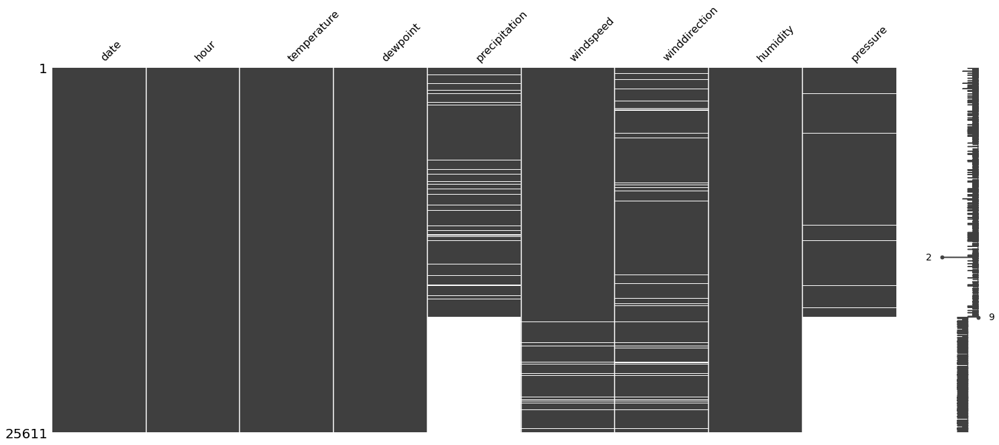

In [13]:
msno.matrix(df_weather_alt)

Die unten dargestellte Heatmap zeigt die Korrelation zwischen den fehlenden Werten zweier Variablen. Werte nahe 1 bedeuten, dass wenn der Wert einer Variable vorhanden ist, auch der Wert der Vergleichsvariable gegeben ist. Im vorliegenden Datenset ist z.B. die Temperatur immer gegeben, wenn auch die Luftfeuchtigkeit gegeben ist. Werte nahe null hingegen bedeuten, dass keine Korrelation der fehlenden Werte vorhanden ist. Dies ist bei Percipitation und Windspeed der Fall.

<AxesSubplot:>

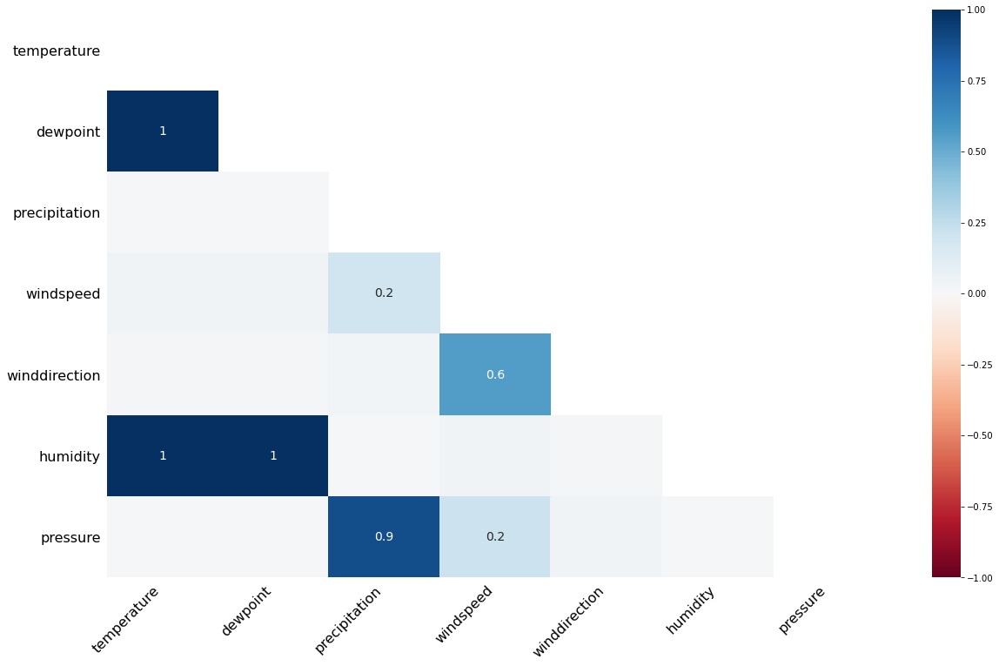

In [14]:
msno.heatmap(df_weather_alt)

Die Daten zeigen, dass für den 01.01.2015 die Wetterdaten fehlen. Kritischer sind jedoch die fehlenden Werte bei Precipitation und Pressure. Diese machen jeweils 37% bzw. 33% der Gesamtwerte aus. 
Daher wird als nächstes das zweite zur Verfügung stehende Wetter-Datenset analysiert um zu entscheiden , ob eine Kombination der Daten zu einem vollständigeren Datenset führt.

<AxesSubplot:>

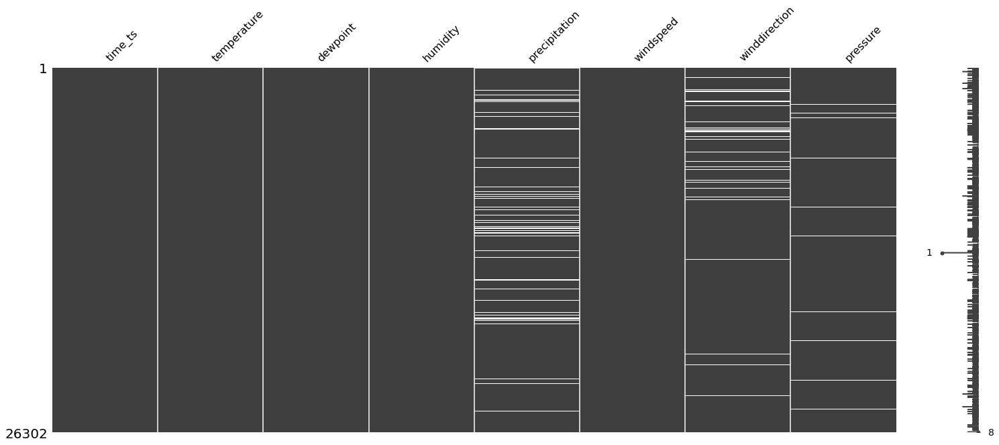

In [15]:
msno.matrix(df_weather_raw)

Die Verteilung der Nullwerte des 2. Datensets zeigt, dass hier für die kritischen Werte Precipitation und Pressure deutlich mehr Werte enthalten sind und vorallem die im anderen Datenset fehlenden Werte am Ende des Betrachtungszeitraums recht vollständig sind. Eine Kombination der beiden Datensets kann somit dazu beitragen, vollständige Daten bzgl. des Wetters zu erhalten.

Abschließend soll  auch für dieses Datenset eine Visualisierung der Korrelationen durchgeführt werden. Auch hier ist die Korrelation zwischen Temperatur und Dewpoint bzw. Humidity und Dewpoint gegeben. Der festgestellte Zusammenhang der fehlenden Werte von Pressure und Precipitation ist jedoch nicht mehr vorhanden.

<AxesSubplot:>

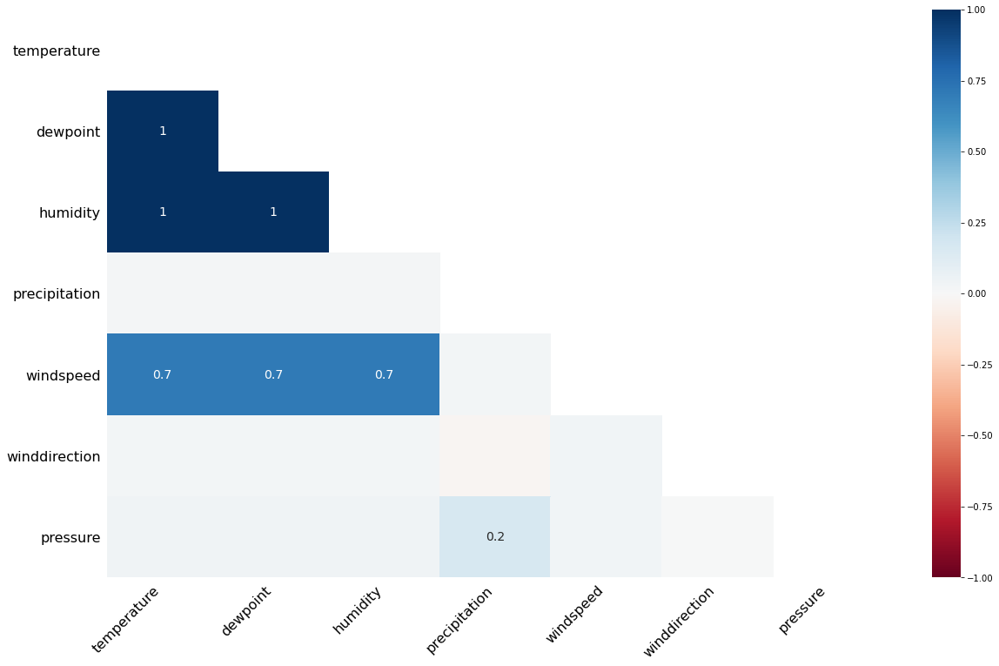

In [16]:
msno.heatmap(df_weather_raw)

### 5.2 Analyse des Nutzungsverhaltens nach Wettereinflüssen

Um den Einfluss des Wetters auf die Ausleihvorgänge zu analysieren müssen zunächst die beiden DataFrames df_trips_complete und df_count_complete um die Wetterdaten ergänzt werden. Hierzu wird basierend auf den oben durchgeführten Analysen bzgl. der fehlenden Werte zunächst der vollständigere Datensatz df_weather_raw angefügt und anschließend fehlende Werte mittels des Dataframes df_weather_alt ergänzt

In [16]:
#Datenset wird um Spalten mit Datum und Stunde ergänzt
df_weather_raw['date'] = df_weather_raw['time_ts'].apply(lambda dt: pd.Timestamp(dt.date()))
df_weather_raw['hour'] = df_weather_raw['time_ts'].apply(lambda dt: dt.time().hour)

In [17]:
df_trips_weather= pd.merge(df_trips_complete, df_weather_raw, left_on=['start_date', 'start_hour'], right_on =['date', 'hour'], how='left').drop('time_ts', axis=1)

In [18]:
df_trips_weather = df_trips_weather.combine_first(df_weather_alt)

In [19]:
df_trips_weather.loc[df_trips_weather['precipitation'].apply(lambda x: x ==0), 'Rain']='no'
df_trips_weather.loc[df_trips_weather['precipitation'].apply(lambda x: x >0), 'Rain']='yes'

#df_count_weather.loc[df_count_weather['precipitation'].apply(lambda x: x ==0), 'Rain']='0'
#df_count_weather.loc[df_count_weather['precipitation'].apply(lambda x: x >0), 'Rain']='1'

Zunächst soll ein Blick auf die Abhängigkeit zwischen Ausleihvorgängen und Temperaturen geworfen werden. Hierzu wird ein Histogramm erstellt, welches Temperatur und Anzahl ausgeliehender Fahrräder in Zusammenhang setzt.
Anhand des Histogramms wird deutlich, dass die meisten Räder bei Temperaturen zwischen 20°C und 25° ausgeliehen werden. Auch bei Temperaturen zwischen 15°C und 19,9°C bzw. 25°C und 29,9°C werden viele Räder ausgeliehen. Ist es wärmer oder kälter, nimmt die Anzahl der geliehenen Räder ab.

In [21]:
d = df_trips_weather.groupby(['temperature', 'Member type'])['start_date'].count().reset_index()
diagram = pd.DataFrame(d)
fig = px.histogram(diagram, x='temperature', y='start_date', color = 'Member type', histfunc="sum", nbins=20)
fig.show()

Vergleicht man nun Mitglieder und Gelegenheitsnutzer, wird deutlich, dass sich das temperaturabhängige Nutzungsverhalten ähnelt. Nur bei Minusgraden fahren Gelegenheitsnutzer nicht.

In [22]:
fig = px.line(diagram, x='temperature', y='start_date', color='Member type', labels={'start_date':'count'})
fig.show()

In [23]:
d = df_trips_weather.groupby(['Rain', 'Member type'])['start_date'].count().reset_index()
diagram = pd.DataFrame(d)

fig = px.bar(diagram, x='Rain', y='start_date', color='Member type', labels={'start_date':'count'})
fig.show()

In [24]:
d = df_trips_weather.groupby(['precipitation', 'Member type'])['start_date'].count().reset_index()
diagram = pd.DataFrame(d)
fig = px.histogram(diagram, x='precipitation', y='start_date', color ='Member type', histfunc="sum", nbins=20)
fig.show()

In [25]:
d = df_trips_weather.groupby(['humidity', 'Member type'])['start_date'].count().reset_index()
diagram = pd.DataFrame(d)
fig = px.bar(diagram, x='humidity', y='start_date', color='Member type', labels={'start_date':'count'})
fig.show()

In [26]:
d = df_trips_weather.groupby(['dewpoint', 'Member type'])['start_date'].count().reset_index()
diagram = pd.DataFrame(d)
fig = px.histogram(diagram, x='dewpoint', y='start_date', histfunc="sum", nbins=20)
fig.show()

In [27]:
Regentage=df_trips_weather.drop_duplicates(['Rain','date', 'hour'])[['Rain','date', 'hour']]
Regentage.describe

<bound method NDFrame.describe of          Rain       date  hour
0          no 2015-10-15  10.0
1          no 2016-07-08  20.0
2          no 2017-10-14  19.0
3          no 2017-05-14  15.0
4          no 2016-06-22  19.0
...       ...        ...   ...
9993314    no 2016-11-21   3.0
9993321   NaN 2015-12-29   3.0
10039609   no 2017-01-10   4.0
10051676   no 2016-02-04   3.0
10092603   no 2016-12-08   3.0

[26607 rows x 3 columns]>

In [28]:
AnzahlFahrtenRegen = pd.value_counts(df_trips_weather['Rain'].values, sort=True)
AnzahlTageRegen = pd.value_counts(Regentage['Rain'].values, sort=True)
AnzahlFahrtenRegen, AnzahlTageRegen

(no     9263302
 yes     390981
 dtype: int64,
 no     23155
 yes     1527
 dtype: int64)

In [29]:
AnzahlFahrtenRegen/AnzahlTageRegen

no     400.056230
yes    256.045187
dtype: float64

Die Analyse der Wetterdaten hat gezeigt, dass nur bei der Temperatur auf dem ersten Blick ein Zusammenhang zu den Ausleihvorgängen besteht.
Bei der Betrachtung des Niederschlags hat sich gezeigt, dass die Anzahl der Ausleihvorgänge zu regenfreien Zeitpunkten deutlich höher ist als wenn es regnet. Hierbei muss aber bedacht werden, dass die Anzahl der regenfreien Stunden deutlich höher ist, als die Anzahl der Stunden mit Niederschlag. Daher muss das Verhältnis der Ausleihvorgänge berechnet werden. Sprich wie viele Fahrten gibt es in einer Stunde mit Regen vs. wie viele Fahrten gibt es in einer Stunde ohne Niederschlag. So lässt sich erkennen, dass bei Regen verhältnismäßig weniger Räder ausgeliehen werden.

In [20]:
df_trips_weather.to_pickle(DATA_PATH+'trips_weather.pkl')

## Ausblick

Für die Entwicklung eines Vorhersagemodells ist es im nächsten Schritt notwendig zu definieren, welche Variablen relevant für die Anzahl der Ausleihvorgänge sind.

Basierend auf dem Data Understanding sind dies potenziell:
    - Temperatur
    - Niederschlag
    - Luftfeuchtigkeit
    - Jahreszeit
    - Wochentag
    - Tageszeit
    
 Diese Variablen müssen hinsichtlich ihrer Korrelation mit der unabhängigen Variable "Anzahl" analysiert werden.